In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, InputLayer
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint

In [3]:

# Paths to the dataset
image_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/images"
mask_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/masks"

# Image size (resize all images to this size)
IMG_HEIGHT, IMG_WIDTH = 256, 256
NUM_CLASSES = 8  # Define the number of classes in the SUIM dataset (you can modify this)

# Load the images and masks
def load_data(image_dir, mask_dir):
    images = []
    masks = []
    
    image_filenames = os.listdir(image_dir)
    image_filenames = sorted(image_filenames)
    mask_filenames = os.listdir(mask_dir)
    mask_filenames = sorted(mask_filenames)
    for image_filename in image_filenames:
        # Load image
        img = cv2.imread(os.path.join(image_dir, image_filename))
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        images.append(img)
        
    for mask_filename in mask_filenames:
        # Load corresponding mask
        mask = cv2.imread(os.path.join(mask_dir, mask_filename))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
        masks.append(mask)
    
    return np.array(images), np.array(masks)


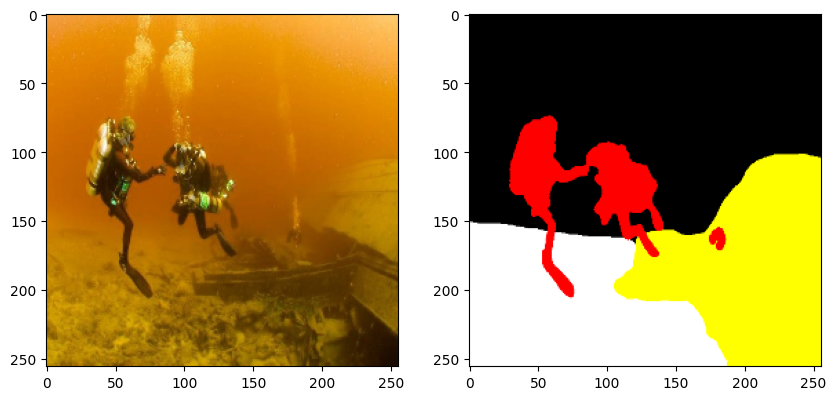

In [4]:
images, masks = load_data(image_dir, mask_dir)
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(images[0])
axs[1].imshow(masks[0])
plt.show()

In [5]:
import numpy as np
from PIL import Image
import os

# Define the color-to-class mapping
color_to_class = {
    (0, 0, 0): 0,         # Background (waterbody)
    (0, 0, 255): 1,       # Human divers
    (0, 255, 0): 2,       # Aquatic plants and sea-grass
    (0, 255, 255): 3,     # Wrecks and ruins
    (255, 0, 0): 4,       # Robots (AUVs/ROVs/instruments)
    (255, 0, 255): 5,     # Reefs and invertebrates
    (255, 255, 0): 6,     # Fish and vertebrates
    (255, 255, 255): 7    # Sea-floor and rocks
}

def mask_to_class(mask, color_to_class):
    mask_rgb = np.array(mask)  # Convert mask to a numpy array
    height, width, _ = mask_rgb.shape
    label_mask = np.zeros((height, width, 8), dtype=np.float32)  # Initialize the class label mask with 8 channels

    # Iterate over the color-to-class mapping and assign class ids
    for rgb, class_id in color_to_class.items():
        # Create a mask where the color matches the current RGB tuple
        match = np.all(mask_rgb == rgb, axis=-1)
        label_mask[:, :, class_id] = match.astype(np.float32)  # Assign 1 to the matching pixels in the corresponding channel

    # print(label_mask.shape)
    return label_mask

# Directory to save class masks
output_dir = "/class_masks"
os.makedirs(output_dir, exist_ok=True)
class_masks=[]
# Process all mask images
for i, mask_image in enumerate(masks):
    # Convert the RGB mask to a class index mask
    class_mask = mask_to_class(mask_image, color_to_class)
    class_masks.append(class_mask)

In [6]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(images, class_masks, test_size=0.2, random_state=42)

# Check the number of samples in each split
print(f"Training samples: {len(X_train)}, Testing samples: {len(X_test)}")

# Now you can use X_train and X_test for training and testing

Training samples: 1220, Testing samples: 305


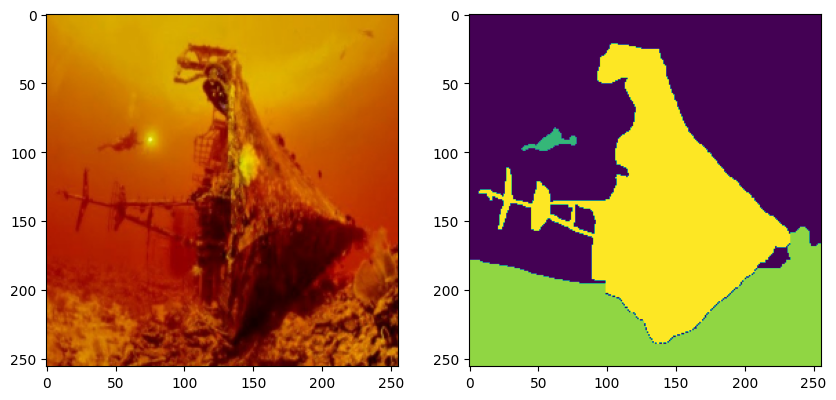

In [7]:
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(X_train[0])
axs[1].imshow(np.argmax(y_train[0],axis=2))
plt.show()

In [8]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

1220
1220
305
305


In [10]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPooling2D, UpSampling2D, Add, Input, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def conv_block(x, filters, kernel_size=3, strides=1, padding='same', use_batchnorm=True):
    x = Conv2D(filters, kernel_size=kernel_size, strides=strides, padding=padding, kernel_regularizer=l2(1e-4))(x)
    if use_batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

def residual_block(x, filters):
    shortcut = x  # Save input for the residual connection

    # Two convolutional layers in the block
    x = conv_block(x, filters)
    x = conv_block(x, filters)
    
    # Add the input (shortcut) to the output (residual connection)
    x = Add()([x, shortcut])
    return x

def upsample_block(x, filters):
    x = UpSampling2D()(x)  # Upsample the feature map
    x = conv_block(x, filters)  # Apply a conv layer after upsampling
    return x

def build_linknet(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # Encoder (Downsampling path)
    conv1 = conv_block(inputs, 64)
    conv1 = residual_block(conv1, 64)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv_block(pool1, 128)
    conv2 = residual_block(conv2, 128)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv_block(pool2, 256)
    conv3 = residual_block(conv3, 256)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = conv_block(pool3, 512)
    conv4 = residual_block(conv4, 512)

    # Decoder (Upsampling path)
    up1 = upsample_block(conv4, 256)
    up1 = Add()([up1, conv3])  # Skip connection (link) to conv3

    up2 = upsample_block(up1, 128)
    up2 = Add()([up2, conv2])  # Skip connection (link) to conv2

    up3 = upsample_block(up2, 64)
    up3 = Add()([up3, conv1])  # Skip connection (link) to conv1

    # Final convolution
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(up3)

    # Build the model
    model = Model(inputs=[inputs], outputs=[outputs])

    return model

# Define input shape and number of classes
input_shape = (256, 256, 3)
num_classes = 8

# Build the LinkNet model
linknet_model = build_linknet(input_shape, num_classes)

# Compile the model
linknet_model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
linknet_model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_16[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_15       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 256, 256,  │     36,928 │ activation_15[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_17[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_16       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 256, 256,  │     36,928 │ activation_16[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_18[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_17       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_7 (Add)         │ (None, 256, 256,  │          0 │ activation_17[0]… │
│                     │ 64)               │            │ activation_15[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 128, 128,  │          0 │ add_7[0][0]       │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_3[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 128, 128,  │    147,584 │ activation_18[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_20[0][0] 

 Total params: 9,382,344 (35.79 MB)

 Trainable params: 9,375,688 (35.77 MB)

 Non-trainable params: 6,656 (26.00 KB)

In [11]:
y_train = np.array(y_train).reshape((1220, 256, 256, 8))

In [12]:
y_test =np.array(y_test).reshape((305, 256, 256, 8))

In [14]:
# Train the model
# print(X_train.shape,y_train.shape)
history = linknet_model.fit(X_train, y_train, epochs=100, batch_size=16, validation_data=(X_test, y_test))

Epoch 1/100


I0000 00:00:1729404843.623789      94 service.cc:145] XLA service 0x7d4c08001770 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729404843.623894      94 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1729404871.846101      94 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


77/77 ━━━━━━━━━━━━━━━━━━━━ 81s 557ms/step - accuracy: 0.3347 - loss: 2.7461 - val_accuracy: 0.3369 - val_loss: 3.9670
Epoch 2/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 25s 325ms/step - accuracy: 0.5395 - loss: 1.7518 - val_accuracy: 0.5138 - val_loss: 2.0028
Epoch 3/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 25s 326ms/step - accuracy: 0.6071 - loss: 1.4824 - val_accuracy: 0.5323 - val_loss: 1.7317
Epoch 4/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 25s 327ms/step - accuracy: 0.6142 - loss: 1.4388 - val_accuracy: 0.5962 - val_loss: 1.4953
Epoch 5/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 25s 327ms/step - accuracy: 0.6288 - loss: 1.3708 - val_accuracy: 0.6437 - val_loss: 1.3737
Epoch 6/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 25s 327ms/step - accuracy: 0.6370 - loss: 1.3051 - val_accuracy: 0.6512 - val_loss: 1.3261
Epoch 7/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 25s 327ms/step - accuracy: 0.6471 - loss: 1.2779 - val_accuracy: 0.6443 - val_loss: 1.3258
Epoch 8/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 25s 326ms/step - accuracy: 0.6587 - loss: 1.2486 - val_accuracy

10/10 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.7177 - loss: 1.0716 
Test Accuracy: 0.7140
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 290ms/step


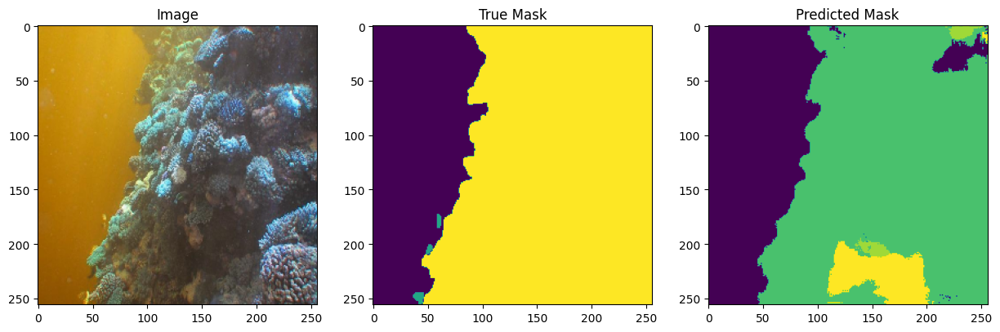

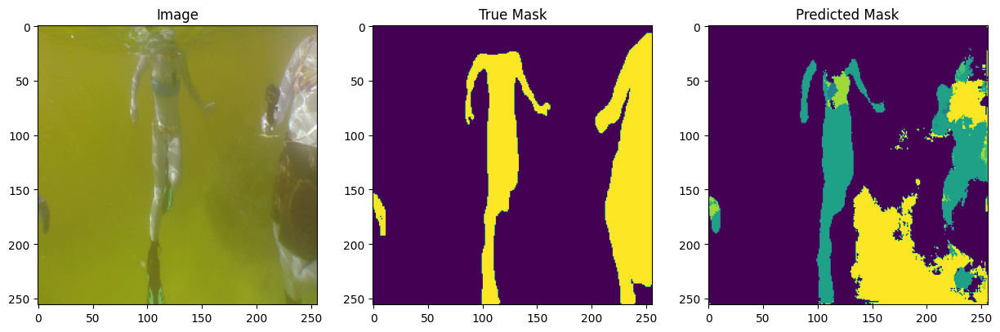

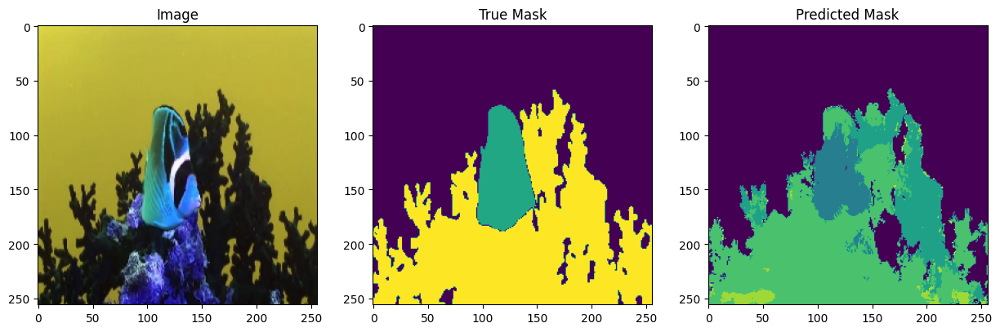

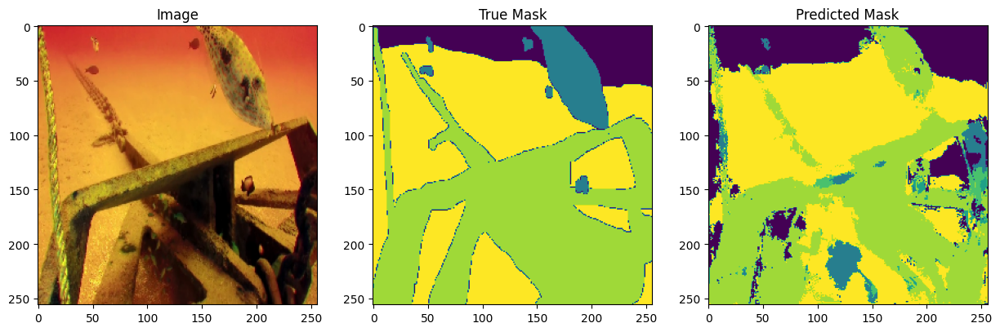

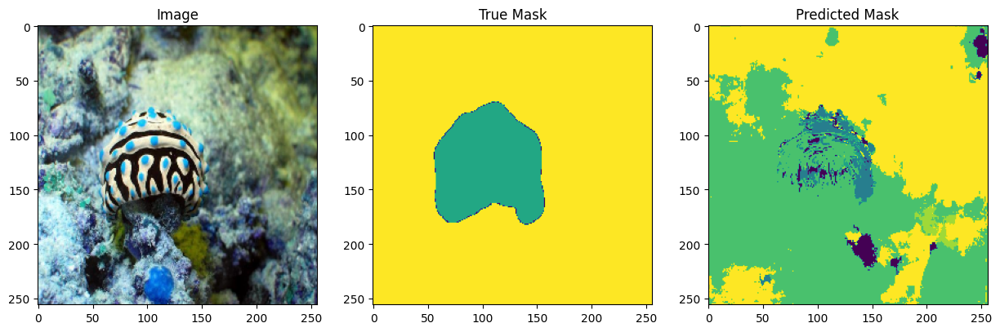

...

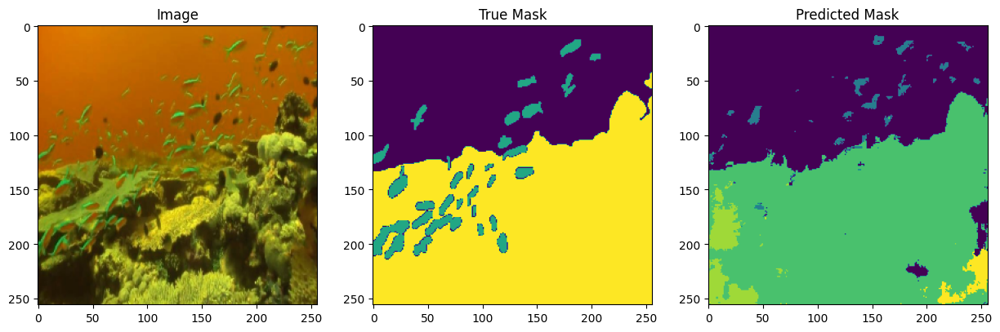

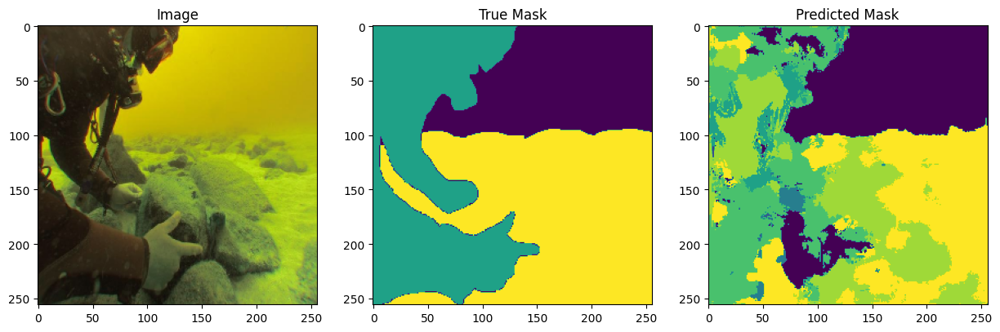

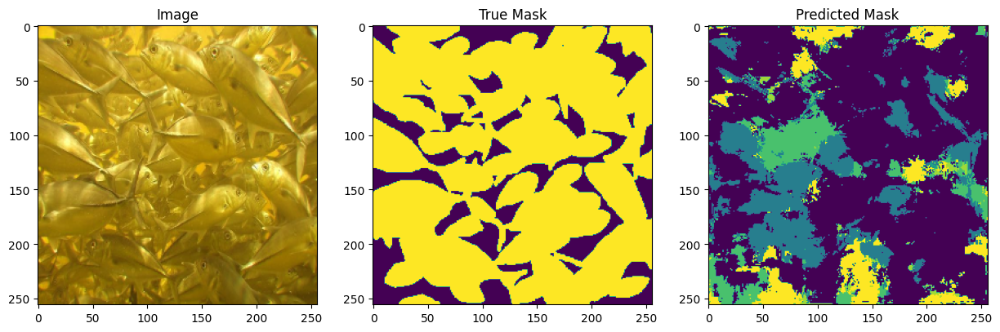

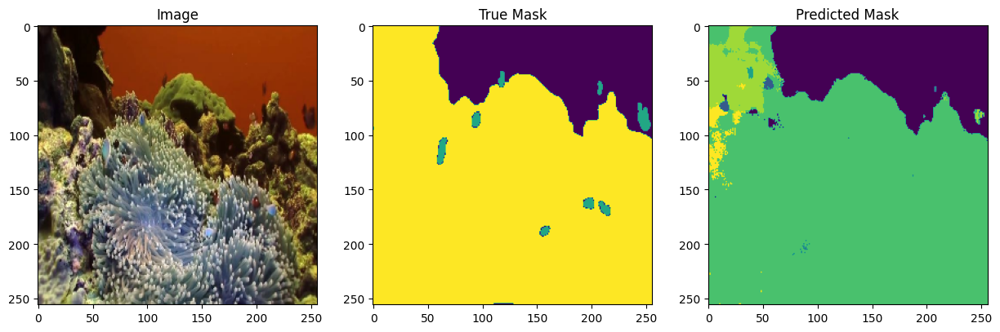

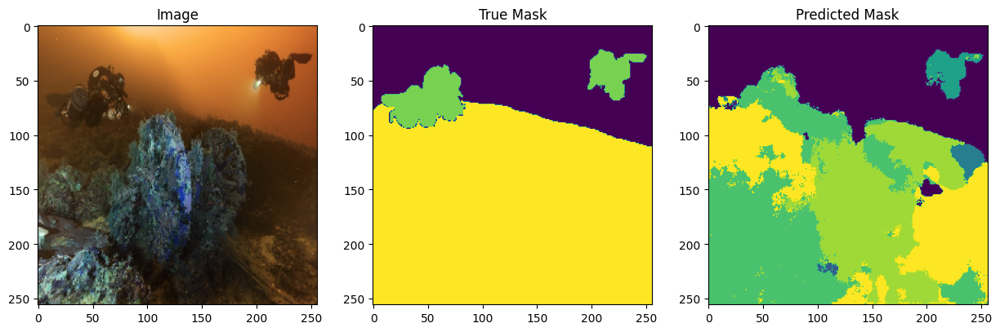

In [15]:
# Evaluate the model
loss, acc = linknet_model.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc:.4f}")

# Predict the masks for the test set
y_pred = linknet_model.predict(X_test)

# Plotting function for results (image, true mask, and predicted mask)
def plot_sample(image, mask_true, mask_pred):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    axs[0].imshow(image)
    axs[0].set_title("Image")
    
    axs[1].imshow(np.argmax(mask_true, axis=2))
    axs[1].set_title("True Mask")
    
    axs[2].imshow(np.argmax(mask_pred, axis=2))
    axs[2].set_title("Predicted Mask")
    
    plt.show()

# Visualize the results
for i in range(50):
    sample_img = X_test[i]
    sample_true_mask = y_test[i]
    sample_pred_mask = y_pred[i]
    
    plot_sample(sample_img, sample_true_mask, sample_pred_mask)


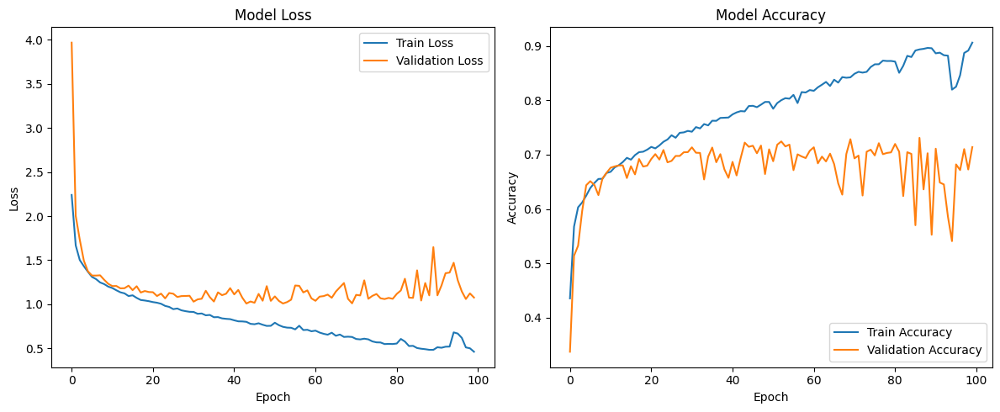

In [17]:
import matplotlib.pyplot as plt

def plot_loss_accuracy(history):
    # Plot training & validation loss values
    plt.figure(figsize=(12, 5))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')

    plt.tight_layout()
    plt.show()

# Example usage
# history = model.fit(...)  # Assuming you have trained the model and history is returned
plot_loss_accuracy(history)
